In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set plotting aesthetics
sns.set(style="whitegrid")


In [13]:
# File paths for processed data
processed_dir = "data/processed"

datasets = {}
for key in ["adult", "adolescent", "child"]:
    file_path = f"{processed_dir}/{key}_processed.csv"
    try:
        df = pd.read_csv(file_path)
        datasets[key] = df
        print(f"Loaded processed dataset '{key}' with shape: {df.shape}")
    except Exception as e:
        print(f"Failed to load processed dataset '{key}': {e}")


Loaded processed dataset 'adult' with shape: (1030, 150)
Loaded processed dataset 'adolescent' with shape: (126, 68)
Loaded processed dataset 'child' with shape: (302, 96)


In [14]:
for key, df in datasets.items():
    print(f"\nDataset: {key}")
    print(df.head())
    print(df.info())
    print(df.describe(include='all').T)



Dataset: adult
    f0   f1   f2   f3   f4   f5   f6   f7   f8   f9  ...  f140  f141  f142  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  ...   0.0   1.0   1.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  ...   0.0   0.0   1.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   0.0   1.0   1.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   0.0   1.0   1.0   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   0.0   0.0   1.0   

   f143  f144  f145  f146  f147  f148  target  
0   0.0   0.0   0.0   0.0   0.0   6.0       0  
1   0.0   1.0   0.0   1.0   0.0   5.0       0  
2   1.0   1.0   1.0   1.0   0.0   8.0       1  
3   0.0   1.0   0.0   1.0   0.0   6.0       0  
4   0.0   0.0   0.0   0.0   0.0   2.0       0  

[5 rows x 150 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Columns: 150 entries, f0 to target
dtypes: float64(149), int64(1)
memory usage: 1.2 MB
None
         count      mean       std  m


Class Distribution in adult dataset:
target
0    515
1    515
Name: count, dtype: int64
target
0    50.0
1    50.0
Name: proportion, dtype: float64


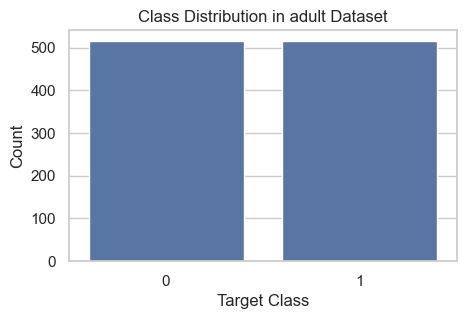


Class Distribution in adolescent dataset:
target
0    63
1    63
Name: count, dtype: int64
target
0    50.0
1    50.0
Name: proportion, dtype: float64


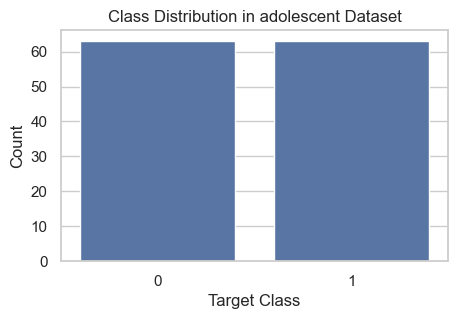


Class Distribution in child dataset:
target
0    151
1    151
Name: count, dtype: int64
target
0    50.0
1    50.0
Name: proportion, dtype: float64


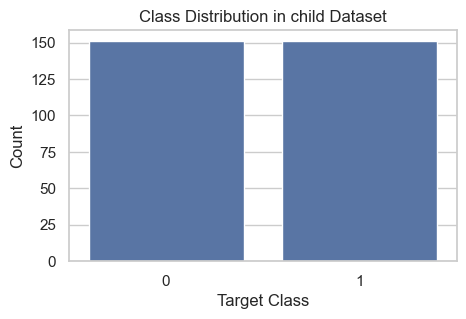

In [15]:
for key, df in datasets.items():
    print(f"\nClass Distribution in {key} dataset:")
    class_counts = df['target'].value_counts()
    class_percentages = df['target'].value_counts(normalize=True) * 100
    print(class_counts)
    print(class_percentages.round(2))

    plt.figure(figsize=(5,3))
    sns.countplot(x='target', data=df)
    plt.title(f"Class Distribution in {key} Dataset")
    plt.xlabel("Target Class")
    plt.ylabel("Count")
    plt.show()


In [16]:
for key, df in datasets.items():
    print(f"\nFeature types and missing values in {key} dataset:")
    print(df.dtypes.value_counts())
    missing = df.isnull().sum()
    print(f"Missing values:\n{missing[missing > 0]}")



Feature types and missing values in adult dataset:
float64    149
int64        1
Name: count, dtype: int64
Missing values:
Series([], dtype: int64)

Feature types and missing values in adolescent dataset:
float64    67
int64       1
Name: count, dtype: int64
Missing values:
Series([], dtype: int64)

Feature types and missing values in child dataset:
float64    95
int64       1
Name: count, dtype: int64
Missing values:
Series([], dtype: int64)


In [17]:
numeric_cols = {}
for key, df in datasets.items():
    numeric_cols[key] = df.select_dtypes(include=[np.number]).columns.tolist()
    print(f"\nNumeric Features in {key} dataset: {numeric_cols[key]}")



Numeric Features in adult dataset: ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28', 'f29', 'f30', 'f31', 'f32', 'f33', 'f34', 'f35', 'f36', 'f37', 'f38', 'f39', 'f40', 'f41', 'f42', 'f43', 'f44', 'f45', 'f46', 'f47', 'f48', 'f49', 'f50', 'f51', 'f52', 'f53', 'f54', 'f55', 'f56', 'f57', 'f58', 'f59', 'f60', 'f61', 'f62', 'f63', 'f64', 'f65', 'f66', 'f67', 'f68', 'f69', 'f70', 'f71', 'f72', 'f73', 'f74', 'f75', 'f76', 'f77', 'f78', 'f79', 'f80', 'f81', 'f82', 'f83', 'f84', 'f85', 'f86', 'f87', 'f88', 'f89', 'f90', 'f91', 'f92', 'f93', 'f94', 'f95', 'f96', 'f97', 'f98', 'f99', 'f100', 'f101', 'f102', 'f103', 'f104', 'f105', 'f106', 'f107', 'f108', 'f109', 'f110', 'f111', 'f112', 'f113', 'f114', 'f115', 'f116', 'f117', 'f118', 'f119', 'f120', 'f121', 'f122', 'f123', 'f124', 'f125', 'f126', 'f127', 'f128', 'f129', 'f130', 'f131', 'f132', 'f133', '


Distribution plots for numeric features in adult dataset:


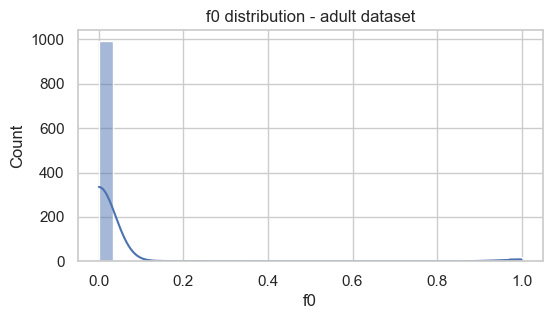

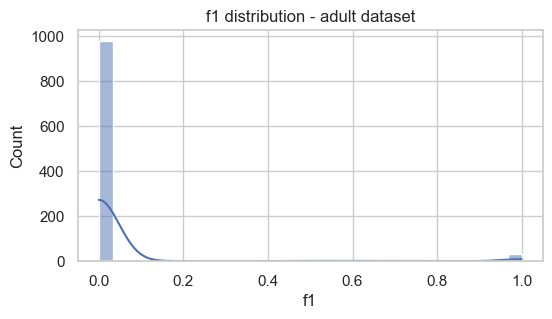

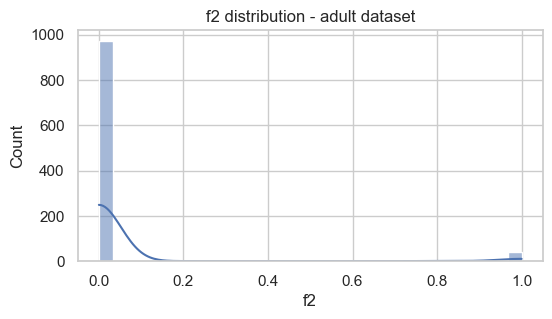

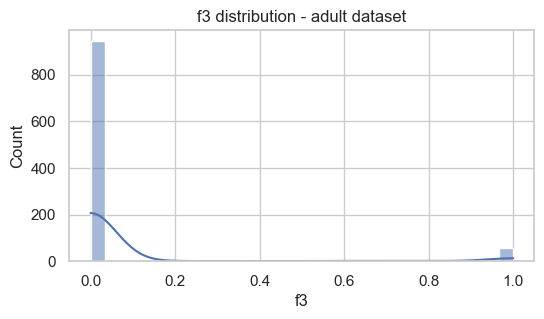

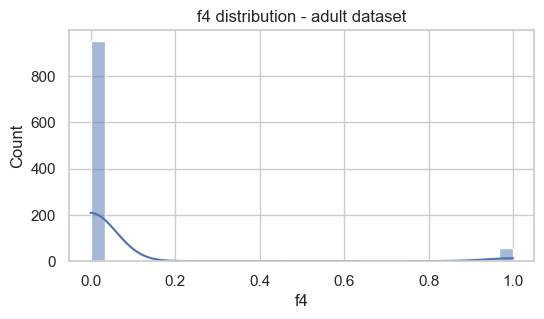

...

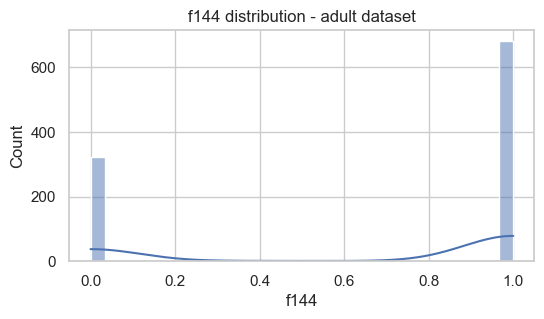

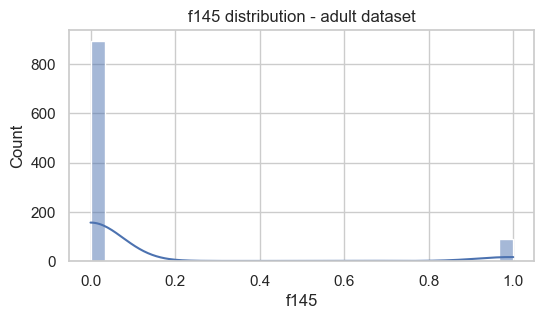

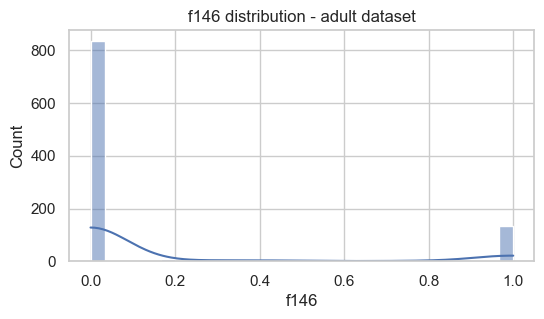

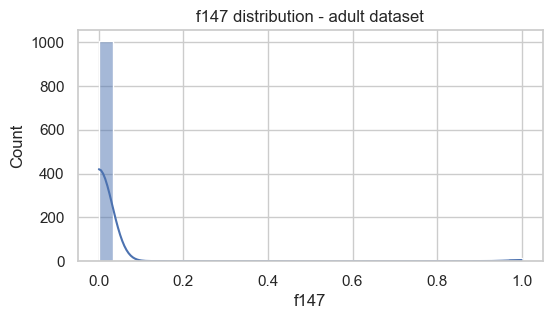

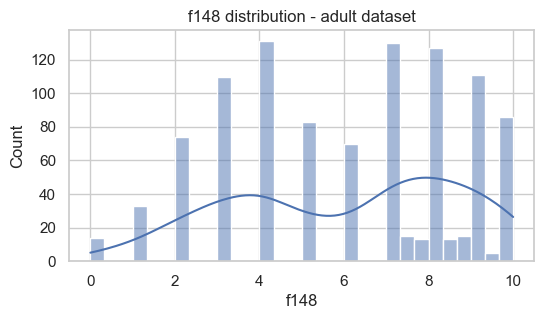


Distribution plots for numeric features in adolescent dataset:


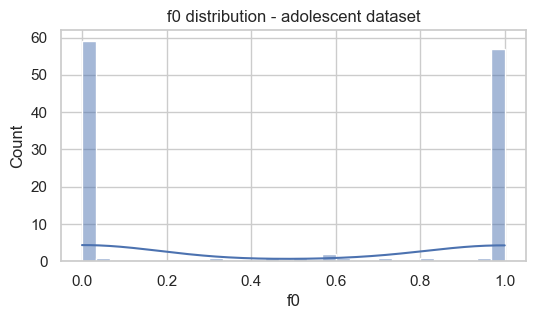

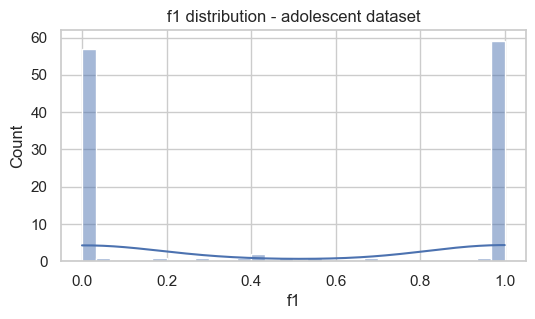

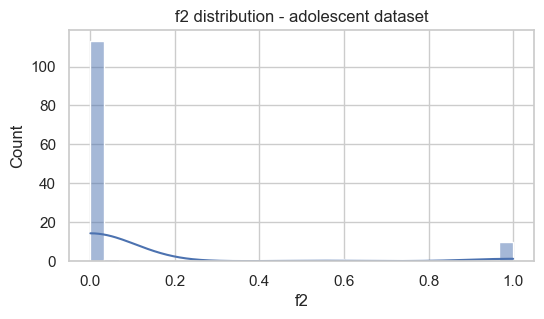

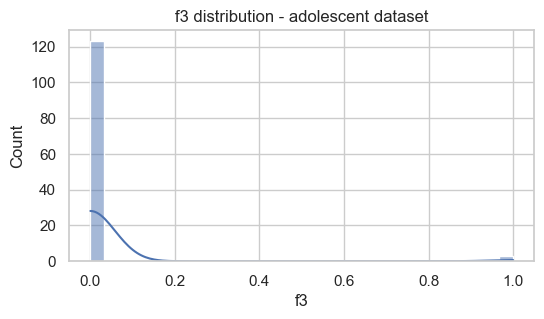

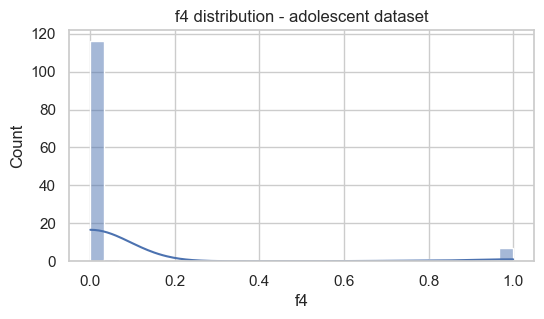

...

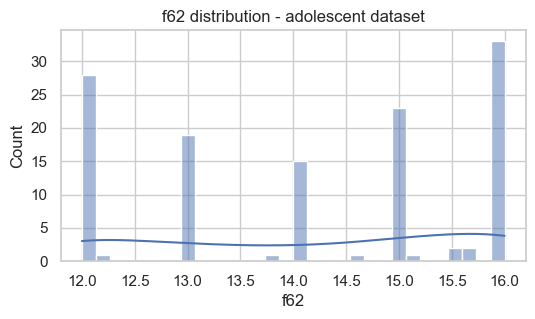

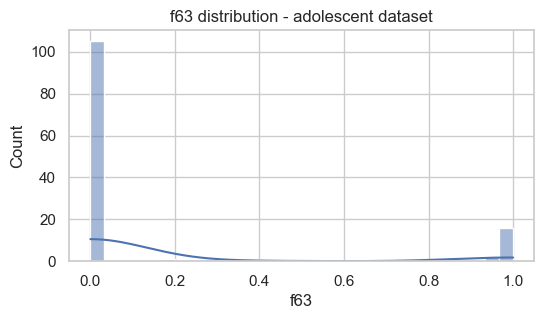

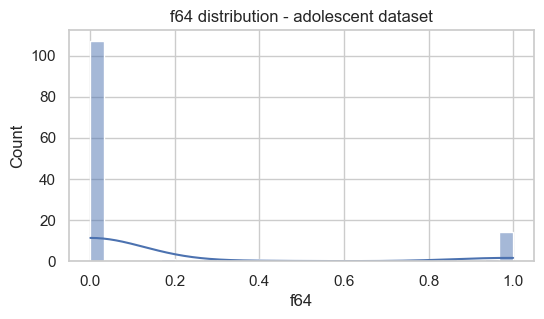

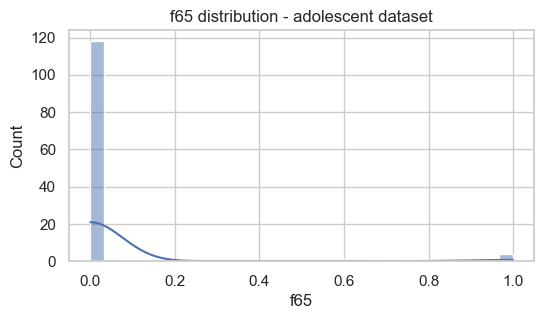

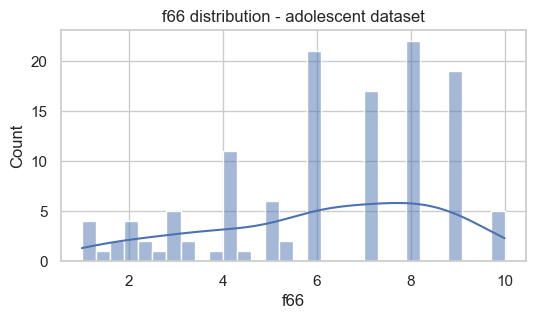


Distribution plots for numeric features in child dataset:


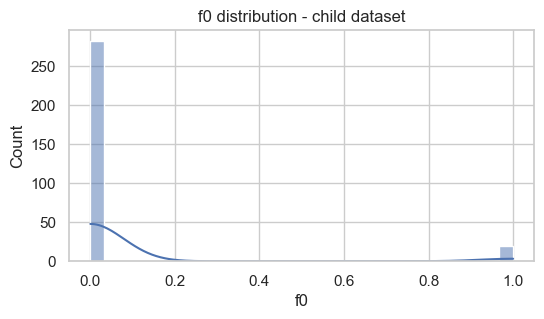

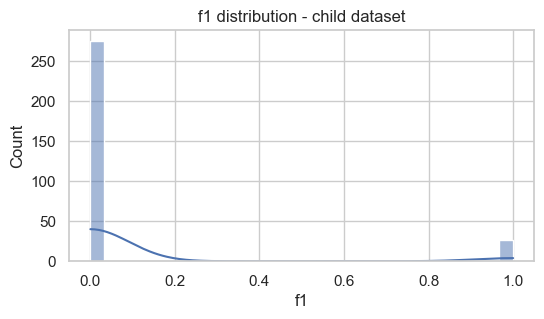

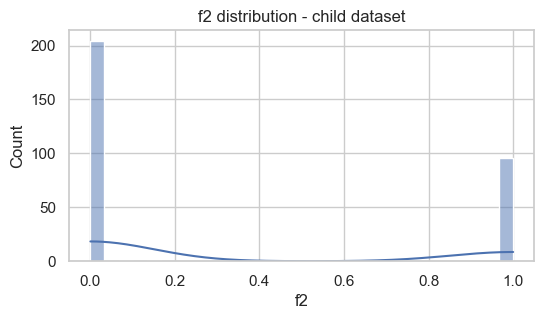

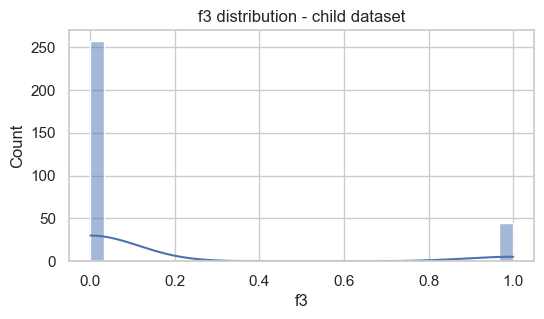

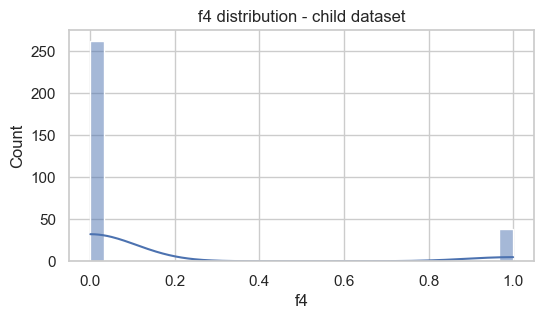

...

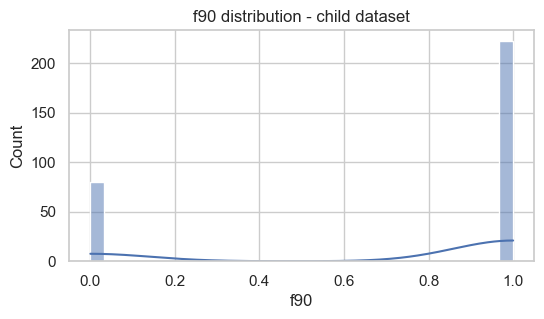

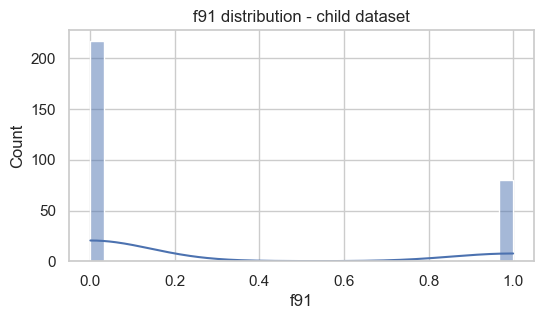

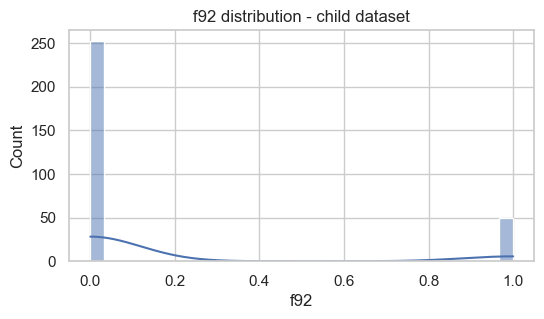

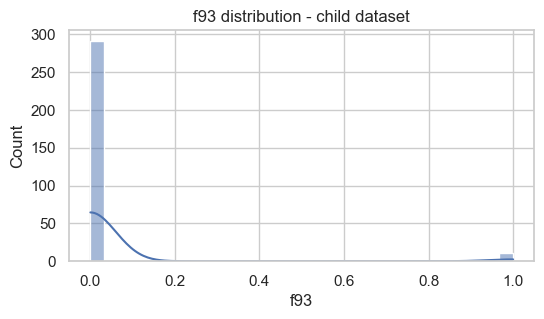

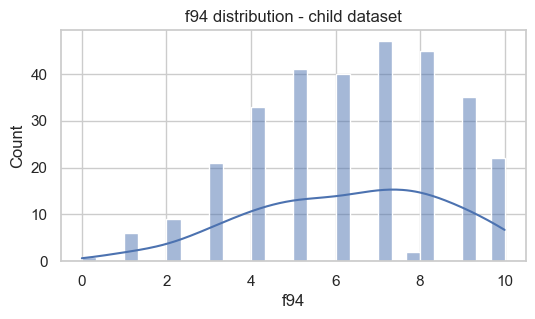

In [18]:
for key, df in datasets.items():
    print(f"\nDistribution plots for numeric features in {key} dataset:")
    for col in numeric_cols[key]:
        if col == 'target':
            continue
        plt.figure(figsize=(6,3))
        sns.histplot(df[col], bins=30, kde=True)
        plt.title(f"{col} distribution - {key} dataset")
        plt.show()


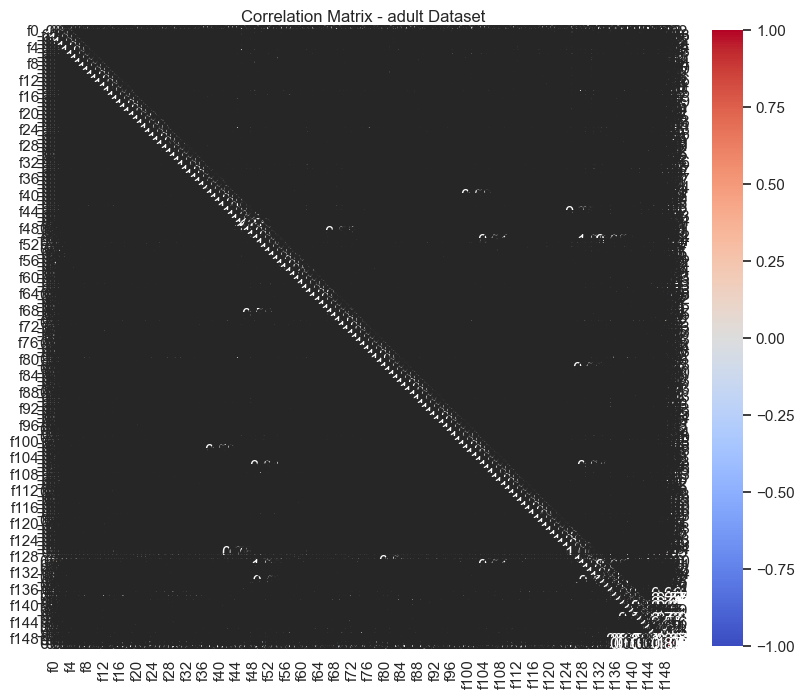

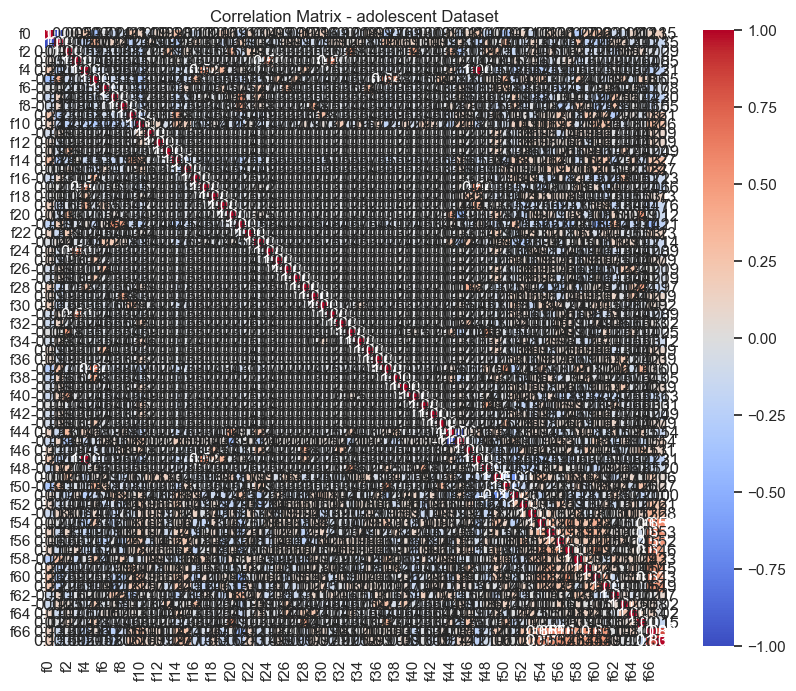

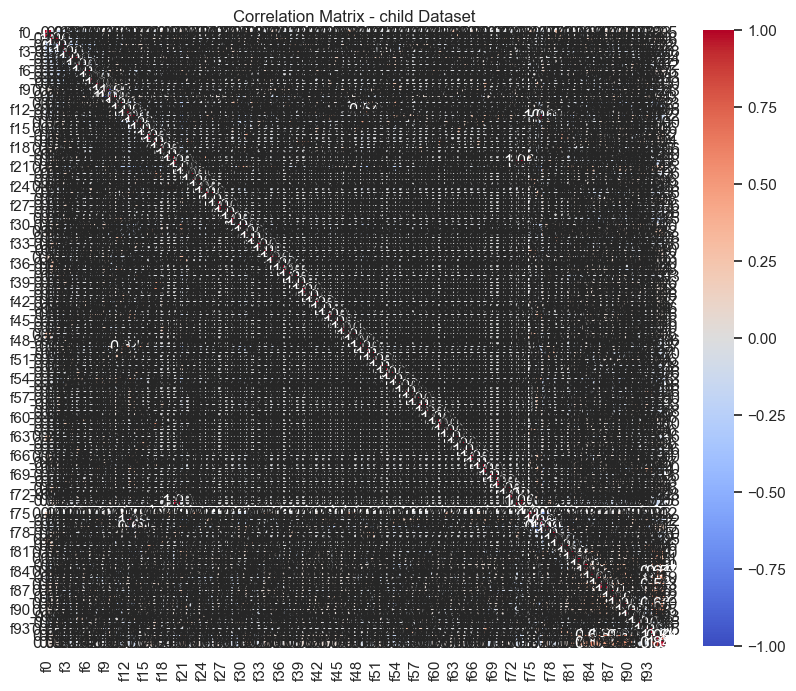

In [19]:
for key, df in datasets.items():
    numeric_df = df.select_dtypes(include=[np.number])
    corr = numeric_df.corr()
    plt.figure(figsize=(10,8))
    sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
    plt.title(f"Correlation Matrix - {key} Dataset")
    plt.show()



Feature-target relationships in adult dataset:


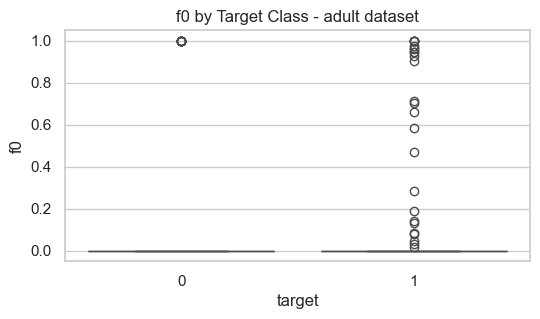

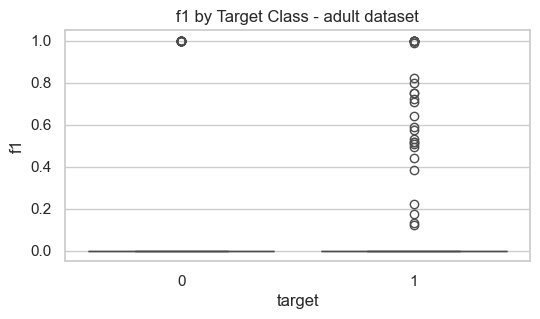

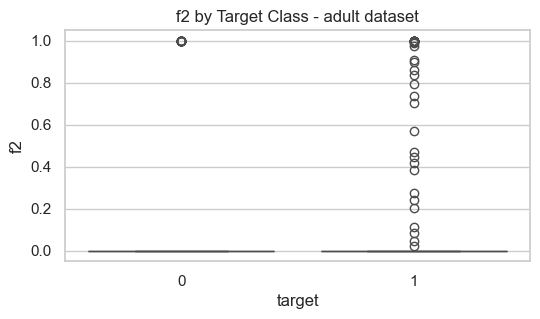

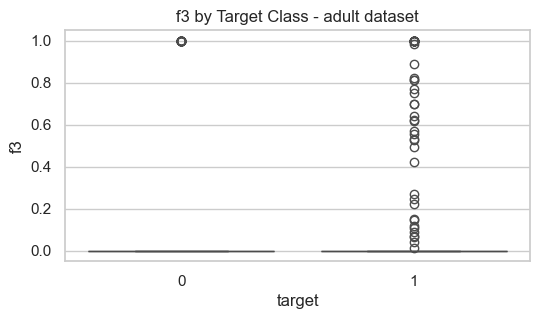

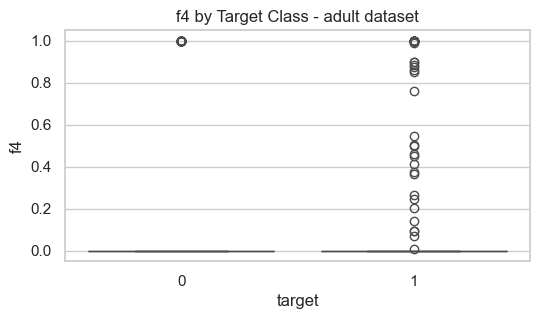

...

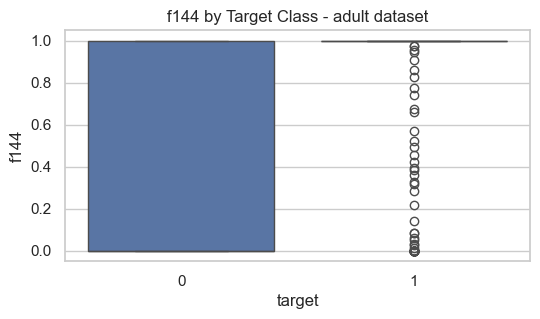

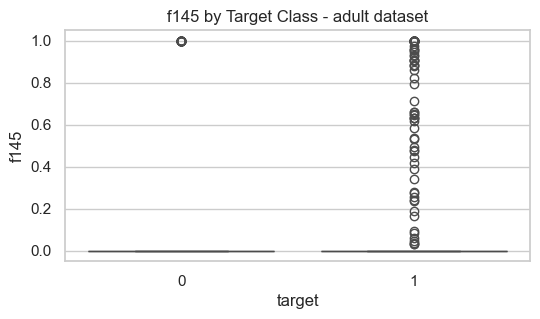

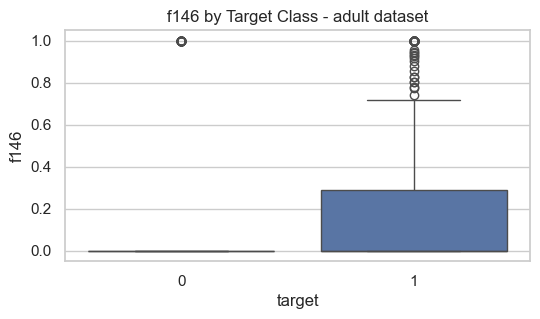

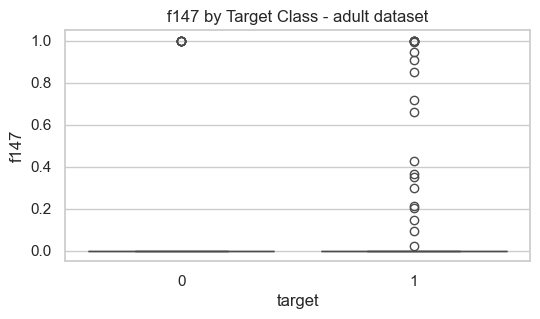

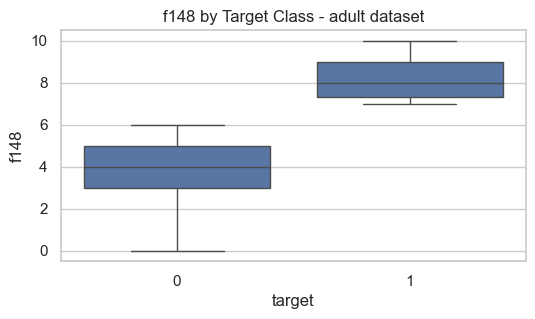


Feature-target relationships in adolescent dataset:


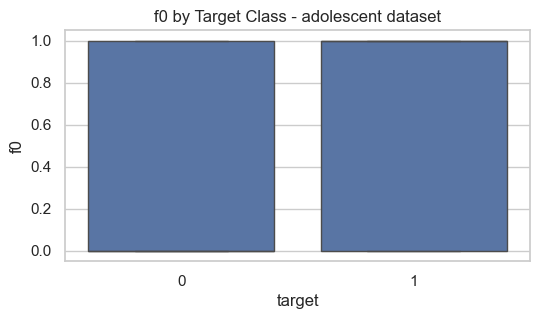

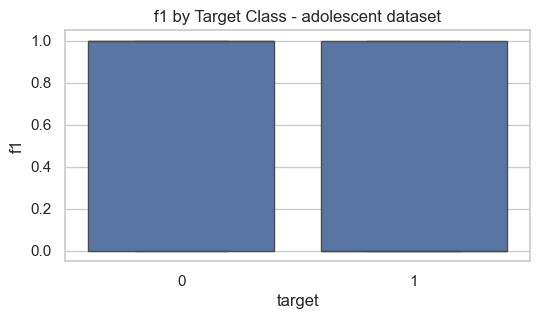

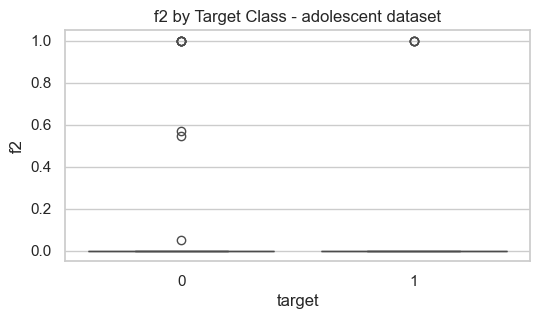

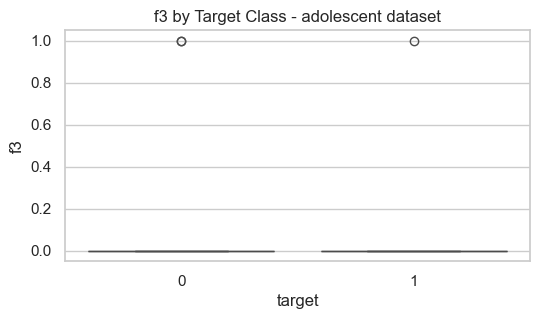

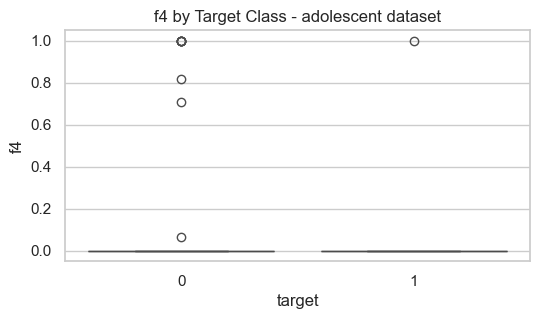

...

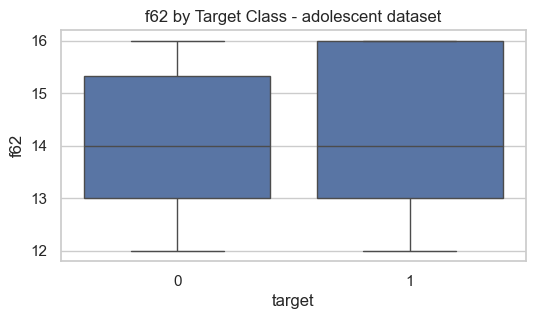

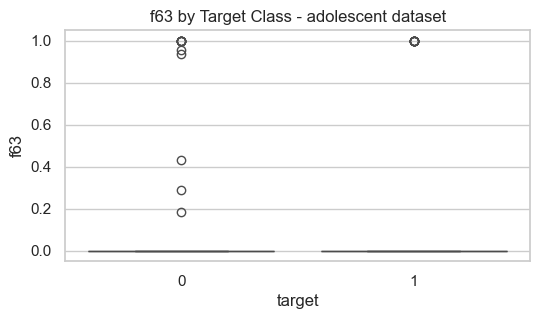

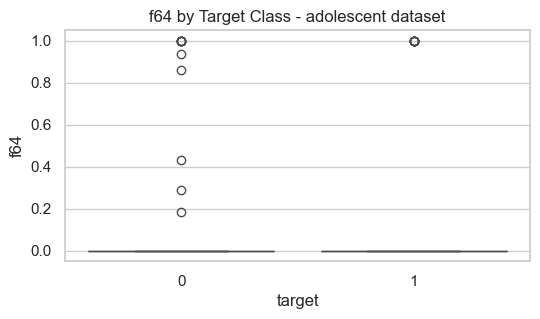

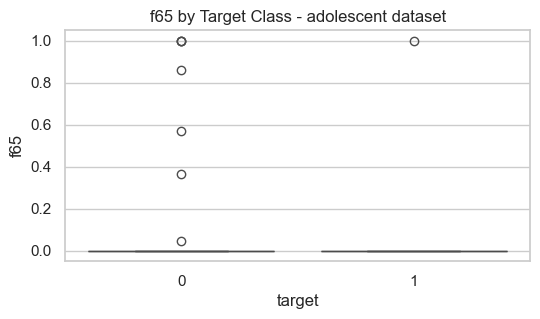

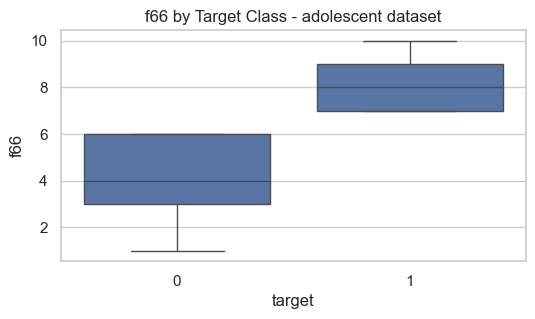


Feature-target relationships in child dataset:


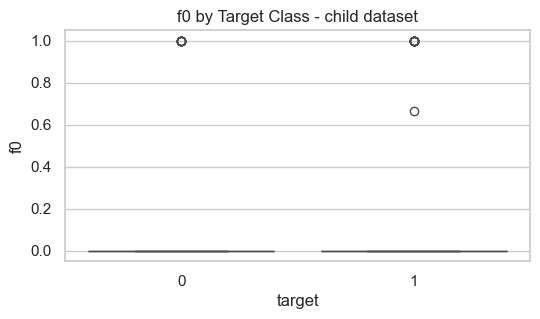

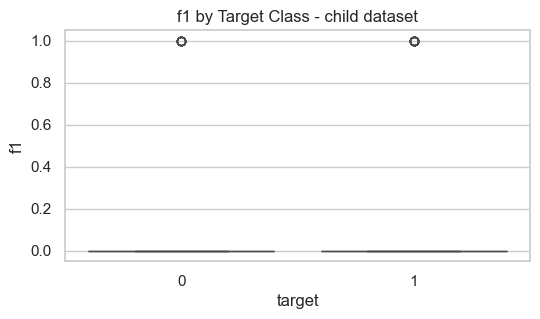

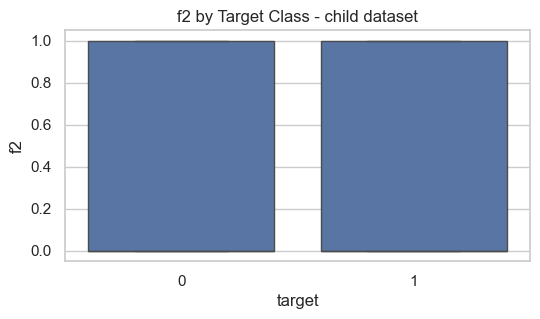

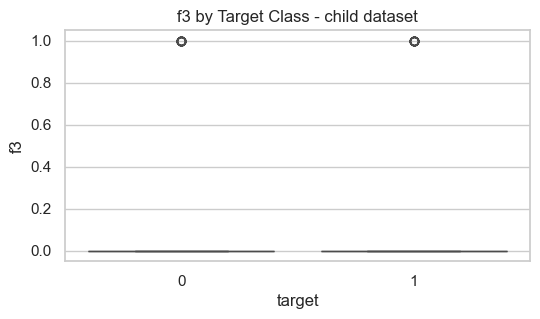

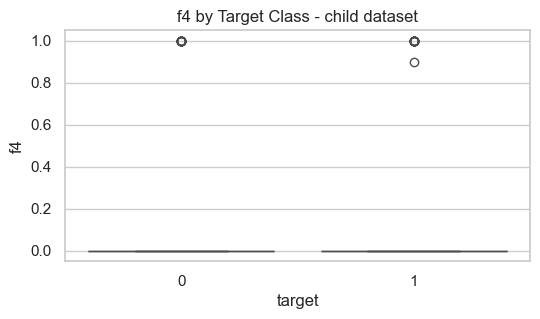

...

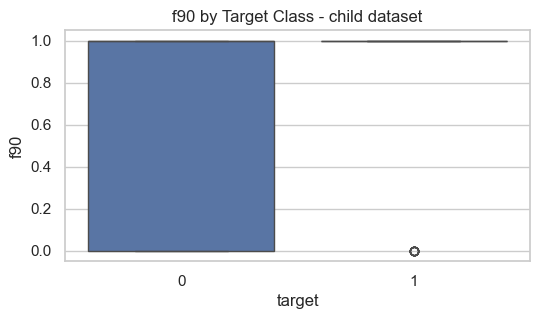

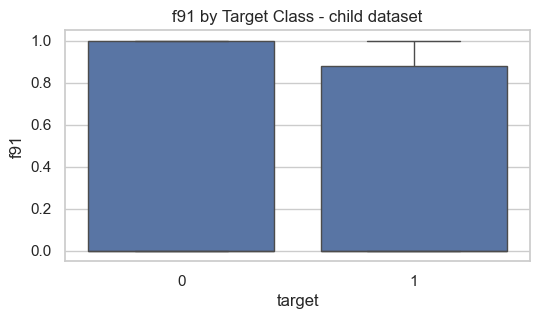

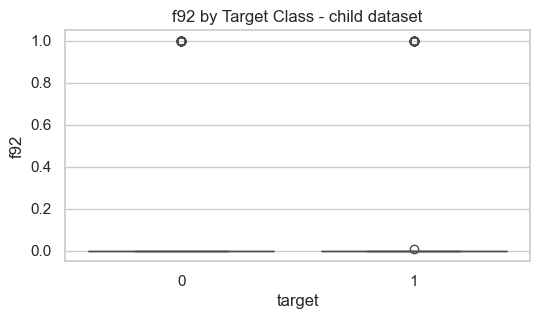

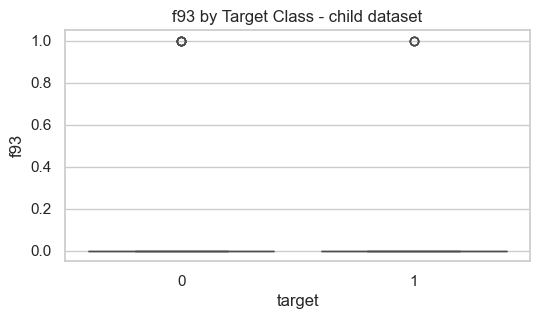

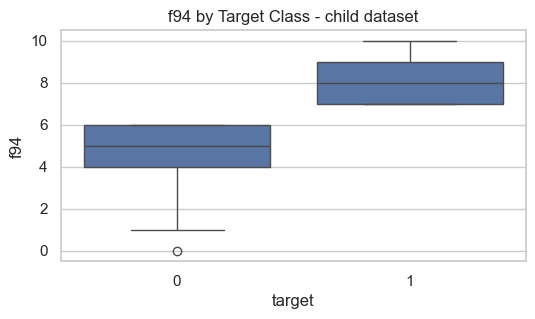

In [20]:
for key, df in datasets.items():
    print(f"\nFeature-target relationships in {key} dataset:")
    numeric_df = df.select_dtypes(include=[np.number])
    for col in numeric_df.columns:
        if col == 'target':
            continue
        plt.figure(figsize=(6,3))
        sns.boxplot(x='target', y=col, data=df)
        plt.title(f"{col} by Target Class - {key} dataset")
        plt.show()


In [21]:
print("Summary:")
print("- Processed datasets loaded for adult, adolescent, and child ASD populations.")
print("- Class balance examined and visualized.")
print("- Numeric features distribution and correlation analyzed.")
print("- Feature-target relationships visualized for classification relevance.")
print("- Next steps: Feature harmonization and cross-dataset modeling.")


Summary:
- Processed datasets loaded for adult, adolescent, and child ASD populations.
- Class balance examined and visualized.
- Numeric features distribution and correlation analyzed.
- Feature-target relationships visualized for classification relevance.
- Next steps: Feature harmonization and cross-dataset modeling.
